# HW04
Deep Learning, AI5302, 2025, Spring, (Tue/Thurs 2:30~3:45)
***

### Problem1. Using DETR on your own image
- Get pretrained model from hugging face
- Take a picture with your camera.
- **The picture must contain your hand written student ID**
- Show the detection result
- Reference : https://huggingface.co/docs/transformers/model_doc/detr
***
### You can add additional code for checking your image and model.
### You must summit ``.ipynb`` file. Do not summit ``.py`` file.
---

### How to submit your homework
Submit your jupyter notebook file with the filename of  *HW02_studentnumber.ipynb*  on GEL

Ex) HW04_20251234.ipynb  

### Submission deadline
2025.05.29, Thursday 23:59 (PM)

### Plagiarism
We encourage you to discuss this homework with your friends or TA, but you should write your own code.




***
***

## Problem 1. (total 10 pt.)
- **Fully Connected Layer vs Convolution Neural Network**
- We will use cifar10 dataset.
- You have to compare with HW1 result and check CNN model has better result.
- The test accuracy of CNN model must bigger than 60%.   
- Reference : https://huggingface.co/docs/transformers/model_doc/detr

### Problem 1-1. (2 pt.)
- **Step 1**. Import package.  
- **Step 2**. Get pretrained model and processor
- **Step 3**. Get your own image

In [1]:

!pip install -q git+https://github.com/huggingface/transformers.git

In [2]:

!pip install -q timm

In [1]:
''' Step 1 '''
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from PIL import Image
from transformers import DetrFeatureExtractor
from torch.optim import Adam
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from transformers import DetrImageProcessor, DetrForObjectDetection
import requests
from io import BytesIO
import matplotlib.pyplot as plt
# import ...

/opt/conda/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/opt/conda/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
!pip install --upgrade torch

  Obtaining dependency information for torch from https://files.pythonhosted.org/packages/cc/2c/91d1de65573fce563f5284e69d9c56b57289625cffbbb6d533d5d56c36a5/torch-2.7.0-cp310-cp310-manylinux_2_28_x86_64.whl.metadata
  Obtaining dependency information for typing-extensions>=4.10.0 from https://files.pythonhosted.org/packages/8b/54/b1ae86c0973cc6f0210b53d508ca3641fb6d0c56823f288d108bc7ab3cc8/typing_extensions-4.13.2-py3-none-any.whl.metadata
  Obtaining dependency information for sympy>=1.13.3 from https://files.pythonhosted.org/packages/a2/09/77d55d46fd61b4a135c444fc97158ef34a095e5681d0a6c10b75bf356191/sympy-1.14.0-py3-none-any.whl.metadata
  Obtaining dependency information for nvidia-cuda-nvrtc-cu12==12.6.77 from https://files.pythonhosted.org/packages/75/2e/46030320b5a80661e88039f59060d1790298b4718944a65a7f2aeda3d9e9/nvidia_cuda_nvrtc_cu12-12.6.77-py3-none-manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for nvidia-cuda-runtime-cu12==12.6.77 from https://files.pyt

In [3]:
!pip install hf_xet

  Obtaining dependency information for hf_xet from https://files.pythonhosted.org/packages/9f/a7/693dc9f34f979e30a378125e2150a0b2d8d166e6d83ce3950eeb81e560aa/hf_xet-1.1.2-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 68.0 MB/s eta 0:00:0000:0100:01


In [ ]:
''' Step 2 '''
#Get pretrained model and processor
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [6]:
''' Step 3 '''
def load_image(image_path):
    if image_path.startswith('http'):  # load from URL
        response = requests.get(image_path)
        img = Image.open(BytesIO(response.content))
    else:  # local 이미지 로드
        img = Image.open(image_path)
    return img

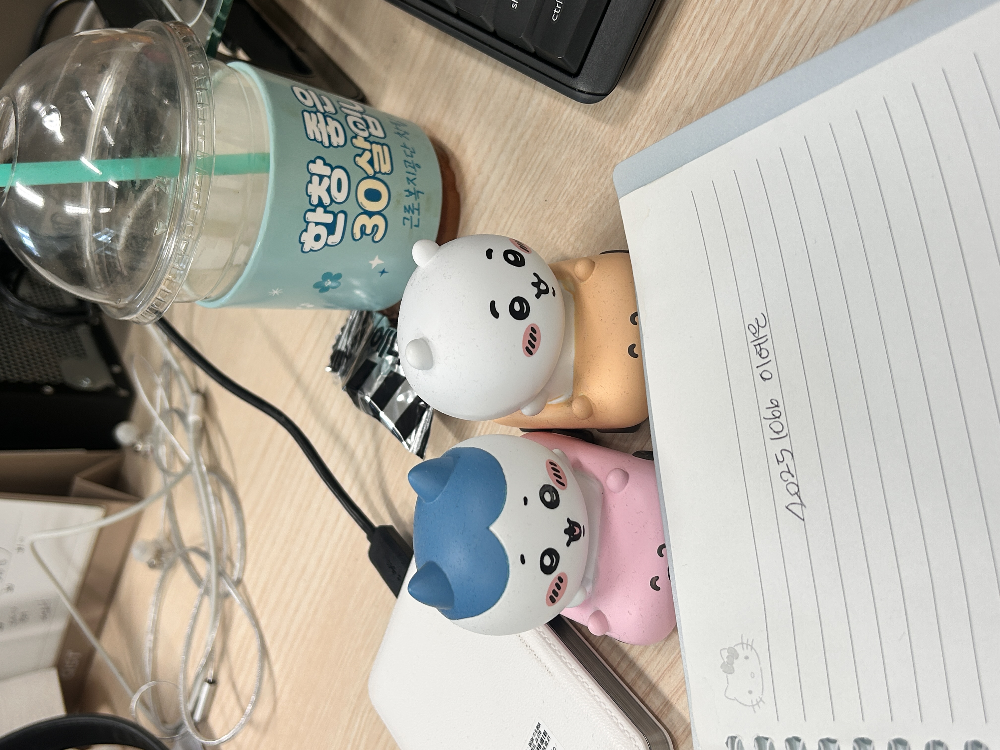

In [7]:
image_path = '/root/Deep_Learning_HW/image_20251066.jpg'  # image path
image = load_image(image_path)
image

In [15]:
# preprocessing image
def preprocess_image(image):
    # Load feature extractor matching with ViT
    '''
    inference 할 때 feature extrator가 필요한 이유:
    train 때에는 data loader 혹은 별도의 전처리 과정을 추가하여 model에 넣지만
    inference 시에는 이미지를 모델이 학습한 방식으로 전처리해야 하기 때문에 필요함.
    '''
    '''
    Reason why a feature extractor is needed during inference:
    During training, data is fed into the model through a data loader or a separate preprocessing step.
    However, during inference, images need to be preprocessed in the same way the model learned from them. This is why a feature extractor is necessary.
    '''

    feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50")
    encoding = feature_extractor(image, return_tensors="pt")
    return encoding

In [17]:
encoding = preprocess_image(image)
encoding

/opt/conda/lib/python3.10/site-packages/transformers/models/detr/feature_extraction_detr.py:40: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(


{'pixel_values': tensor([[[[-1.0048, -1.0048, -0.9705,  ...,  1.0844,  1.1872,  1.2043],
          [-0.9877, -0.9877, -0.9705,  ...,  1.1700,  1.2728,  1.3413],
          [-0.9705, -0.9705, -0.9705,  ...,  1.3413,  1.3755,  1.4783],
          ...,
          [-1.8097, -1.8439, -1.8439,  ...,  1.7865,  1.7694,  1.7523],
          [-1.8268, -1.8439, -1.8610,  ...,  1.8037,  1.7865,  1.7865],
          [-1.8268, -1.8439, -1.8610,  ...,  1.8379,  1.8037,  1.7865]],

         [[-1.0728, -1.0728, -1.0378,  ...,  1.3256,  1.4132,  1.4307],
          [-1.0553, -1.0553, -1.0378,  ...,  1.4132,  1.4832,  1.5357],
          [-1.0378, -1.0378, -1.0378,  ...,  1.5532,  1.5707,  1.6408],
          ...,
          [-1.7031, -1.7381, -1.7381,  ...,  1.9559,  1.9384,  1.9209],
          [-1.7206, -1.7381, -1.7556,  ...,  1.9734,  1.9559,  1.9559],
          [-1.7206, -1.7381, -1.7556,  ...,  2.0084,  1.9734,  1.9559]],

         [[-1.0550, -1.0550, -1.0201,  ...,  1.5942,  1.6814,  1.6814],
          [-1

### Problem 1-2. (4 pt.)
- **Step 1**. Get the result of model prediction.
- **Step 2**. Filter out the result.

In [ ]:
''' Step 1 '''
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{model.config.id2label[cl.item()]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()



In [24]:
''' Step 2 '''
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
inputs = {k: v.to(device) for k, v in preprocess_image(image).items()}
with torch.no_grad():
    outputs = model(**inputs)

target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.5)[0]



In [22]:
print(f"Detected {len(results['scores'])} objects.")
for score, label in zip(results['scores'], results['labels']):
    print(f"Label: {label.item()}, Score: {score.item()}")

Detected 0 objects.


### Problem 1-3. (4 pt.)
- **Step 1**. Visualize the Result
- **The picture must contain your hand-written Student ID**.

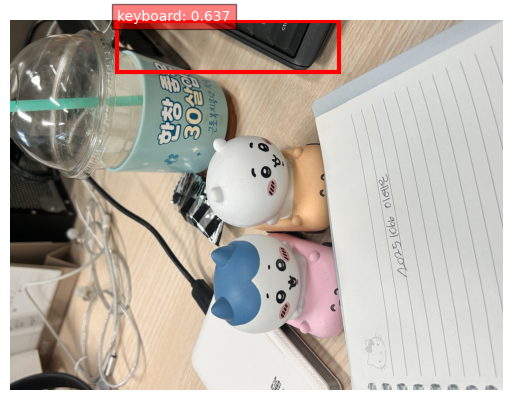

In [25]:
''' Step 1 '''

plt.imshow(image)
ax = plt.gca()
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    
    ax.add_patch(plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="red", linewidth=3))
    ax.text(box[0], box[1], f"{model.config.id2label[label.item()]}: {round(score.item(), 3)}", fontsize=10, color="white", bbox=dict(facecolor='red', alpha=0.5))

plt.axis("off")
plt.show()


---
---